In [270]:
"""# Import Libraries"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

In [271]:
#ignore warning messages 
import warnings
warnings.filterwarnings('ignore') 

In [272]:
"""# Import Datasets"""

df_train = pd.read_csv('Train_Dataset.csv')
df_test = pd.read_csv('Test_Dataset.csv')

In [273]:
"""# Import Datasets"""

df_train = pd.read_csv('Train_Dataset.csv')
df_test = pd.read_csv('Test_Dataset.csv')

"""# Define Functions"""

def set_outliers_to_nan(p , feature_boundries):
  df = p.copy()

  for key in feature_boundries.keys():
    feature = key
    lower_bound = feature_boundries[key][0]
    upper_bound = feature_boundries[key][1]
    print(feature , lower_bound , upper_bound)
    df.loc[df[feature] < lower_bound , feature] = np.nan
    df.loc[df[feature] > upper_bound, feature] = np.nan
  return df

def isNaN(num):
    if float('-inf') < float(num) < float('inf'):
        return False
    else:
        return True

def linear_regression_imputation_to_nan(p, corr_features):
    df = p.copy()
    for c_f in corr_features:
        # impute median for both same index values are nan
        f1 = c_f[0]
        f2 = c_f[1]
        df.loc[df[f1].isnull() & df[f2].isnull(), f1] = df[f1].median()
        df.loc[df[f1].isnull() & df[f2].isnull(), f2] = df[f2].median()

        model1 = LinearRegression()
        model2 = LinearRegression()
        data = df.dropna(subset=c_f)
        
        data_f1 = data[[f1]]
        data_f2 = data[[f2]]
      
        model1.fit(data_f1, data_f2)
        model2.fit(data_f2, data_f1)
        
        for i in df.index:
            if isNaN(df[f1][i]):
                x = np.array([[df[f2][i]]])
                df[f1][i] = model2.predict(x)[0][0]

            elif isNaN(df[f2][i]):
                x = np.array([[df[f1][i]]])

                df[f2][i] = model1.predict(x)[0][0]

    return df

def categorical_imputation_by_most_frequent_value(p, features):
    df = p.copy()
    for f in features:
        frq_val = df_train[~df_train[f].isnull()][f].value_counts().idxmax()
        df[f] = df[f].fillna(frq_val)
    return df

def nan_imputation_by_median(p, features):
    df = p.copy()
    for feature in features:
        df.loc[df[feature].isnull(), feature] = df[feature].median()
    return df

def show_correlations(dataframe, show_chart = True):
    fig = plt.figure(figsize = (20,10))
    corr = dataframe.corr()
    if show_chart == True:
        sns.heatmap(corr, 
                    xticklabels=corr.columns.values,
                    yticklabels=corr.columns.values,
                    annot=True)
    return corr


In [274]:
"""# Define Variables"""

cat_col = ['location_code' , 'intertiol_plan' , 'voice_mail_plan' , 'Churn']

num_col = ['account_length',
             'number_vm_messages',
             'total_day_min',
             'total_day_calls',
             'total_day_charge',
             'total_eve_min',
             'total_eve_calls',
             'total_eve_charge',
             'total_night_minutes',
             'total_night_calls',
             'total_night_charge',
             'total_intl_minutes',
             'total_intl_calls',
             'total_intl_charge',
             'customer_service_calls']

feature_boundries = {'account_length': [0, 210],
                    'number_vm_messages': [0, 50],
                    'total_day_min': [0, 350],
                    'total_day_calls': [0, 160],
                    'total_day_charge': [0, 60],
                    'total_eve_min': [0, 400],
                    'total_eve_calls': [40, 170],
                    'total_eve_charge': [3, 31],
                    'total_night_minutes': [23, 400],
                    'total_night_calls': [30, 175],
                    'total_night_charge': [0, 20],
                    'total_intl_minutes': [0, 20],
                    'total_intl_calls': [0, 18],
                    'total_intl_charge': [0, 5],
                    'customer_service_calls': [0, 9]}

correlated_feature_couple = [['total_eve_charge', 'total_eve_min'],
                   ['total_night_charge', 'total_night_minutes'],
                   ['total_intl_charge', 'total_intl_minutes'],
                   ['total_day_charge', 'total_day_min']]

cat_col1 = ['location_code' , 'intertiol_plan' , 'voice_mail_plan']

non_corr_numer_col = ['account_length',
             'number_vm_messages',
             'total_day_calls',
             'total_eve_calls',
             'total_night_calls',
             'total_intl_calls',
             'customer_service_calls']

In [275]:
"""# Drop Unwanted Columns"""

df_train = df_train.drop(columns=['Unnamed: 20'] , errors='ignore')

df_test = df_test.drop(columns=['Unnamed: 20' , 'Unnamed: 19'] , errors='ignore')

In [276]:
"""# Drop Duplicates"""

df1 = df_train.drop(columns=['customer_id'])

duplicates = df1.duplicated()

i = 0
dup_index = []
while i<=2320:
  if(duplicates[i]): dup_index.append(i)
  i += 1

df_train = df_train.drop(labels=dup_index, axis=0)

In [277]:
"""# Handle Invalid Data"""

for i in num_col:
  df_train[i] = np.where(df_train[i] < 0, np.NaN , df_train[i])

for i in num_col:
  df_test[i] = np.where(df_test[i] < 0, np.NaN , df_test[i])

In [278]:
"""# Handle Outliers"""

df_train = set_outliers_to_nan(df_train , feature_boundries)

df_test = set_outliers_to_nan(df_test , feature_boundries)

account_length 0 210
number_vm_messages 0 50
total_day_min 0 350
total_day_calls 0 160
total_day_charge 0 60
total_eve_min 0 400
total_eve_calls 40 170
total_eve_charge 3 31
total_night_minutes 23 400
total_night_calls 30 175
total_night_charge 0 20
total_intl_minutes 0 20
total_intl_calls 0 18
total_intl_charge 0 5
customer_service_calls 0 9
account_length 0 210
number_vm_messages 0 50
total_day_min 0 350
total_day_calls 0 160
total_day_charge 0 60
total_eve_min 0 400
total_eve_calls 40 170
total_eve_charge 3 31
total_night_minutes 23 400
total_night_calls 30 175
total_night_charge 0 20
total_intl_minutes 0 20
total_intl_calls 0 18
total_intl_charge 0 5
customer_service_calls 0 9


In [279]:
"""# Handle Missing Values"""

df_train = linear_regression_imputation_to_nan(df_train , correlated_feature_couple)

df_train = categorical_imputation_by_most_frequent_value(df_train , cat_col1)

df_train = nan_imputation_by_median(df_train , non_corr_numer_col)

df_train = df_train[~df_train['Churn'].isnull()]

df_test = linear_regression_imputation_to_nan(df_test , correlated_feature_couple)

df_test = categorical_imputation_by_most_frequent_value(df_test , cat_col1)

df_test = nan_imputation_by_median(df_test , non_corr_numer_col)


In [280]:
df_train_onehot = df_train.copy()
df_test_onehot = df_test.copy()

In [281]:
enc = OneHotEncoder(handle_unknown='ignore')
enc_df_train = pd.DataFrame(enc.fit_transform(df_train_onehot[['location_code']]).toarray())

In [282]:
enc_df_test = pd.DataFrame(enc.fit_transform(df_test_onehot[['location_code']]).toarray())

In [283]:
onehot_col = ['location_code_452' , 'location_code_445' ,'location_code_547']

In [284]:
df_train_onehot.insert(2 , 'location_code_452' , enc_df_train[0].values , False)
df_train_onehot.insert(3 , 'location_code_445' , enc_df_train[1].values , False)
df_train_onehot.insert(4 , 'location_code_547' , enc_df_train[2].values , False)

In [285]:
df_test_onehot.insert(2 , 'location_code_452' , enc_df_test[0].values , False)
df_test_onehot.insert(3 , 'location_code_445' , enc_df_test[1].values , False)
df_test_onehot.insert(4 , 'location_code_547' , enc_df_test[2].values , False)

In [286]:
df_train[onehot_col] = df_train_onehot[onehot_col]

In [287]:
df_test[onehot_col] = df_test_onehot[onehot_col]

In [288]:
df_train = df_train.drop(columns=['location_code'])

In [289]:
df_test = df_test.drop(columns=['location_code'])

In [290]:
df_train

,customer_id,account_length,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,...,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn,location_code_452,location_code_445,location_code_547
0,1001,15.0,no,no,0.0,121.1,130.0,20.59,216.0,86.0,...,33.0,10.58,16.1,5.0,4.35,2.0,No,0.0,1.0,0.0
1,1002,105.0,no,no,0.0,259.3,96.0,44.08,175.2,97.0,...,36.0,10.01,12.0,5.0,3.24,3.0,No,0.0,1.0,0.0
2,1003,97.0,no,yes,32.0,183.4,94.0,31.18,269.1,120.0,...,38.0,9.16,6.7,4.0,1.81,5.0,No,0.0,1.0,0.0
3,1004,121.0,no,yes,35.0,68.7,95.0,11.68,209.2,69.0,...,42.0,8.88,11.4,4.0,3.08,1.0,No,1.0,0.0,0.0
4,1005,98.0,no,yes,22.0,278.3,89.0,47.31,93.4,143.0,...,42.0,4.84,9.7,5.0,2.62,0.0,No,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2316,3317,109.0,no,no,0.0,180.0,100.0,30.60,229.0,103.0,...,105.0,6.27,7.8,8.0,2.11,3.0,No,0.0,1.0,0.0
2317,3318,185.0,yes,yes,30.0,154.1,114.0,26.20,118.7,106.0,...,105.0,11.63,12.9,3.0,3.48,2.0,No,0.0,1.0,0.0
2318,3319,55.0,yes,no,0.0,188.9,88.0,34.62,270.1,105.0,...,105.0,9.17,14.3,5.0,3.86,1.0,Yes,0.0,1.0,0.0
2319,3320,138.0,yes,no,0.0,191.2,130.0,32.35,164.5,88.0,...,105.0,10.46,15.2,1.0,4.10,0.0,Yes,0.0,0.0,1.0


In [291]:
# Scaling

In [292]:
df_train_sc = df_train.copy()
df_test_sc = df_test.copy()

In [293]:
scaler = StandardScaler()
scaler.fit(df_train_sc[num_col])

StandardScaler()

In [294]:
sc_df_train = pd.DataFrame(scaler.transform(df_train_sc[num_col]) , columns=num_col , index = df_train_sc.index)

In [295]:
for f in num_col:
    df_train_sc[f] = sc_df_train[f]

In [296]:
scaler.fit(df_test_sc[num_col])

StandardScaler()

In [297]:
sc_df_test = pd.DataFrame(scaler.transform(df_test_sc[num_col]) , columns=num_col , index = df_test_sc.index)

In [298]:
for f in num_col:
    df_test_sc[f] = sc_df_test[f]

In [299]:
col = list(df_train.columns)
col.remove('customer_id')
col.remove('Churn')
col

['account_length',
 'intertiol_plan',
 'voice_mail_plan',
 'number_vm_messages',
 'total_day_min',
 'total_day_calls',
 'total_day_charge',
 'total_eve_min',
 'total_eve_calls',
 'total_eve_charge',
 'total_night_minutes',
 'total_night_calls',
 'total_night_charge',
 'total_intl_minutes',
 'total_intl_calls',
 'total_intl_charge',
 'customer_service_calls',
 'location_code_452',
 'location_code_445',
 'location_code_547']

In [300]:
df_train.voice_mail_plan = df_train.voice_mail_plan.map(dict(yes=1, no=0))

In [301]:
df_train.intertiol_plan = df_train.intertiol_plan.map(dict(yes=1, no=0))

In [302]:
df_train.Churn = df_train.Churn.map(dict(Yes=1, No=0))

In [303]:
df_test.voice_mail_plan = df_test.voice_mail_plan.map(dict(yes=1, no=0))

In [304]:
df_test.intertiol_plan = df_test.intertiol_plan.map(dict(yes=1, no=0))

In [305]:
df_train_sc.voice_mail_plan = df_train_sc.voice_mail_plan.map(dict(yes=1, no=0))
df_train_sc.intertiol_plan = df_train_sc.intertiol_plan.map(dict(yes=1, no=0))
df_train_sc.Churn = df_train_sc.Churn.map(dict(Yes=1, No=0))

In [306]:
df_test_sc.voice_mail_plan = df_test_sc.voice_mail_plan.map(dict(yes=1, no=0))
df_test_sc.intertiol_plan = df_test_sc.intertiol_plan.map(dict(yes=1, no=0))

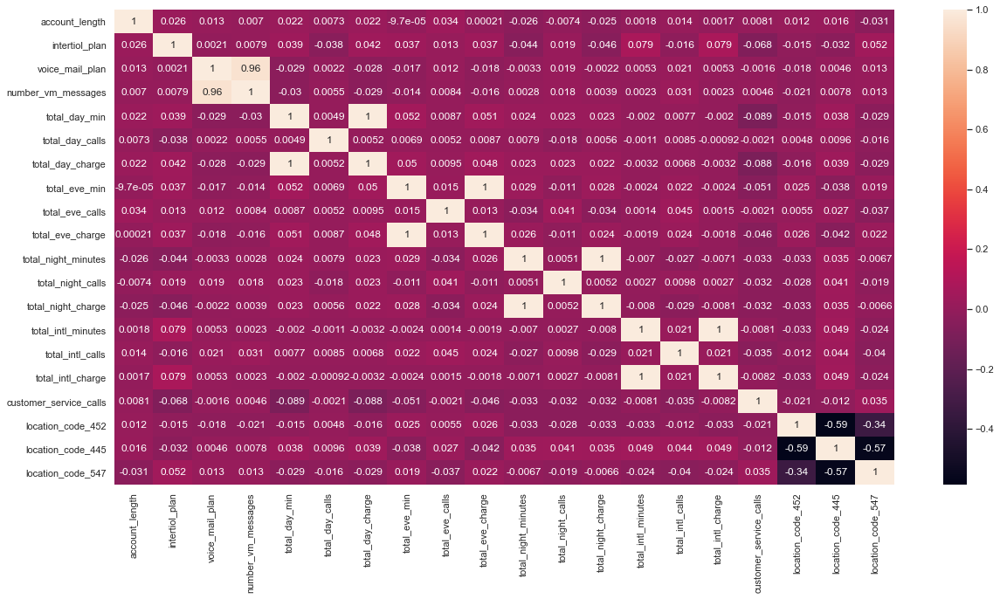

In [307]:
correlation_df = show_correlations(df_train[col],show_chart=True)

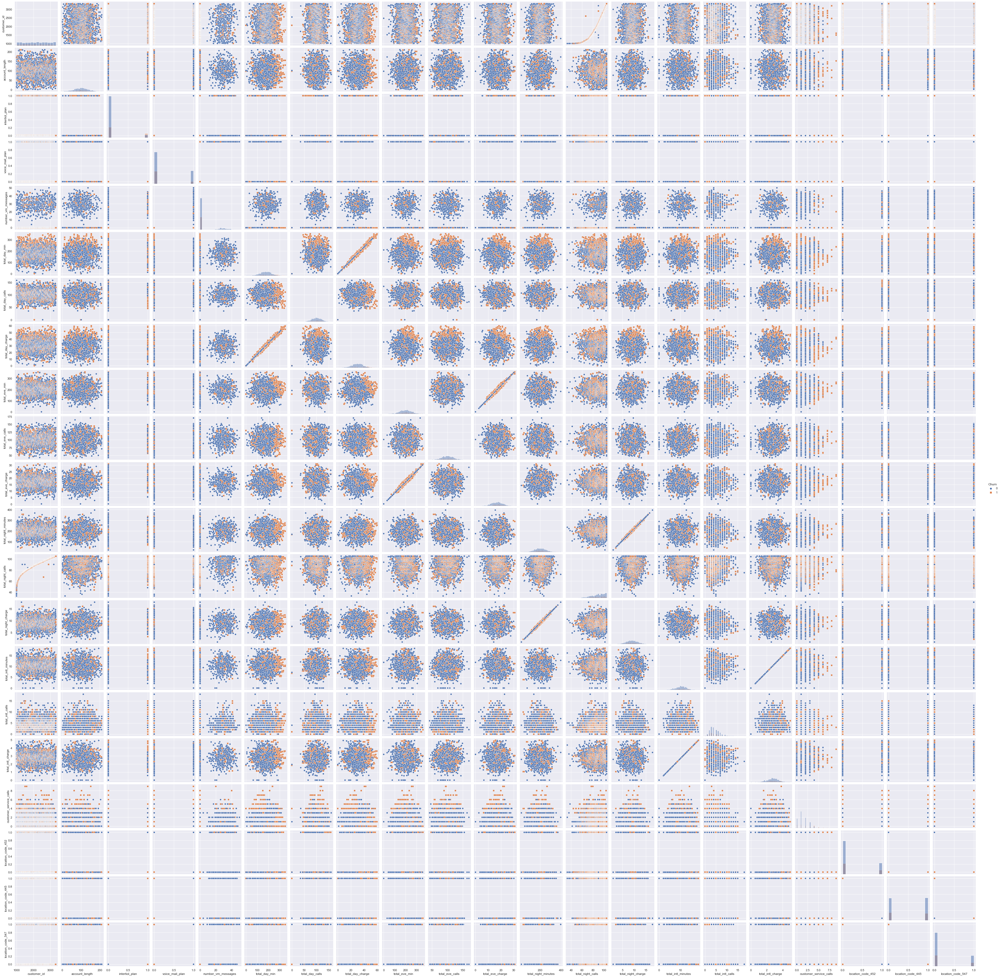

In [308]:
sns.set(rc={'figure.figsize':(11.7,8.27)}) 
sns.pairplot(data = df_train, hue="Churn", diag_kind="hist" , markers=["o", "s"])

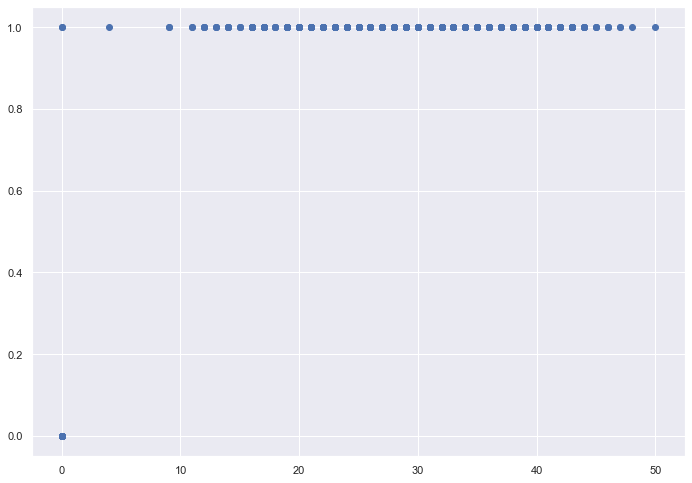

In [309]:
plt.scatter(df_train['number_vm_messages'],df_train['voice_mail_plan'])
plt.show()

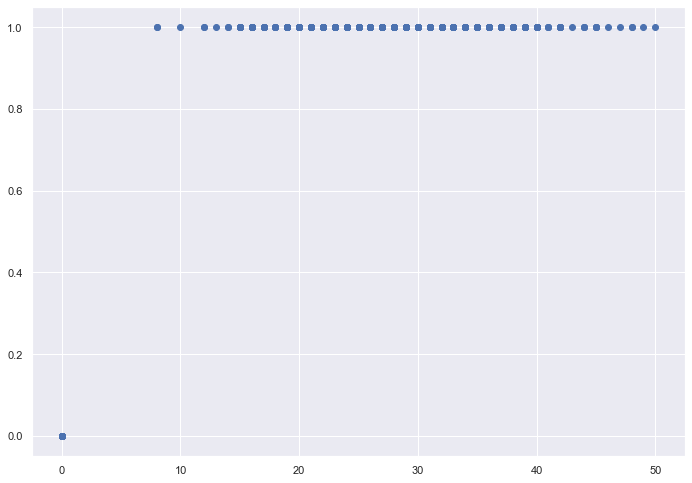

In [310]:
plt.scatter(df_test['number_vm_messages'],df_test['voice_mail_plan'])
plt.show()

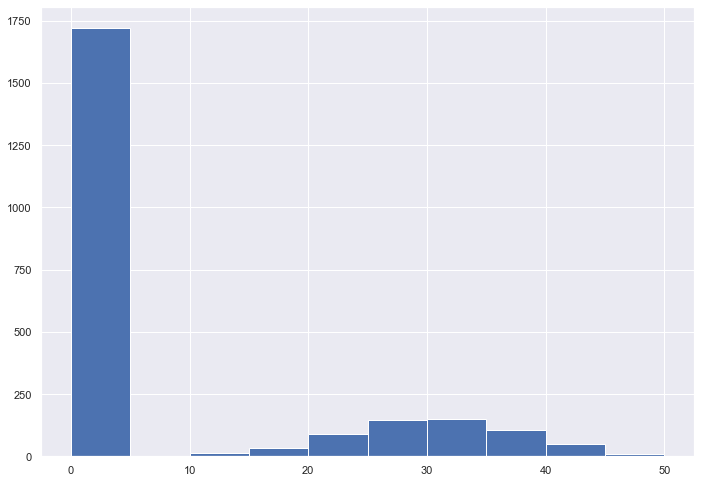

In [311]:
plt.hist(df_train['number_vm_messages'])
plt.show() 

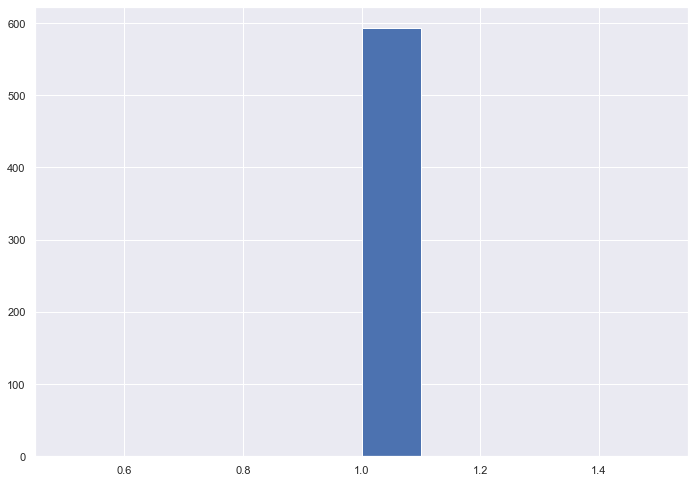

In [312]:
plt.hist(df_train[df_train['number_vm_messages']!=0]['voice_mail_plan'])
plt.show() 

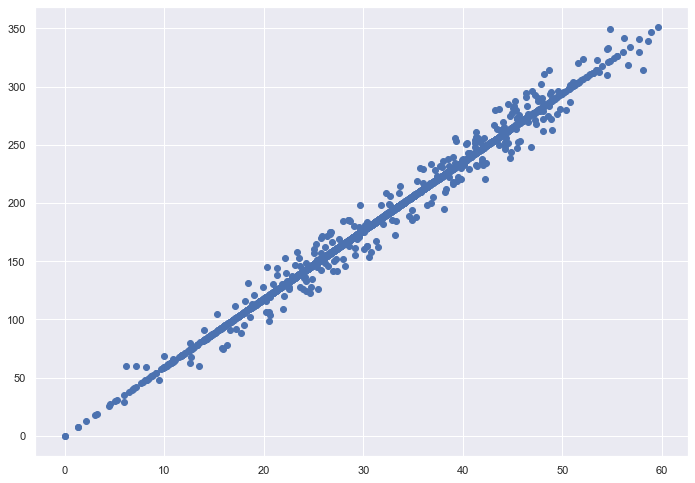

In [313]:
plt.scatter(df_train['total_day_charge'],df_train['total_day_min'])
plt.show()

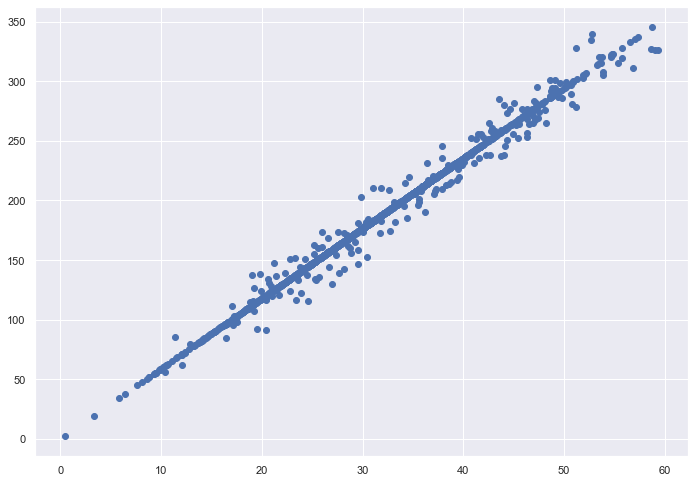

In [314]:
plt.scatter(df_test['total_day_charge'],df_test['total_day_min'])
plt.show()

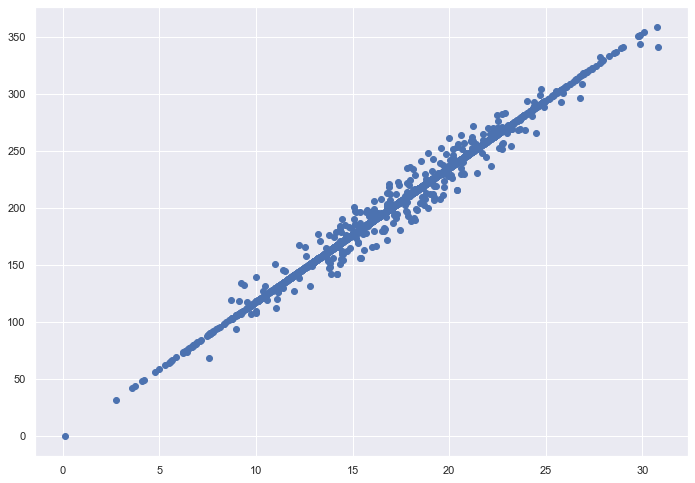

In [315]:
plt.scatter(df_train['total_eve_charge'],df_train['total_eve_min'])
plt.show()

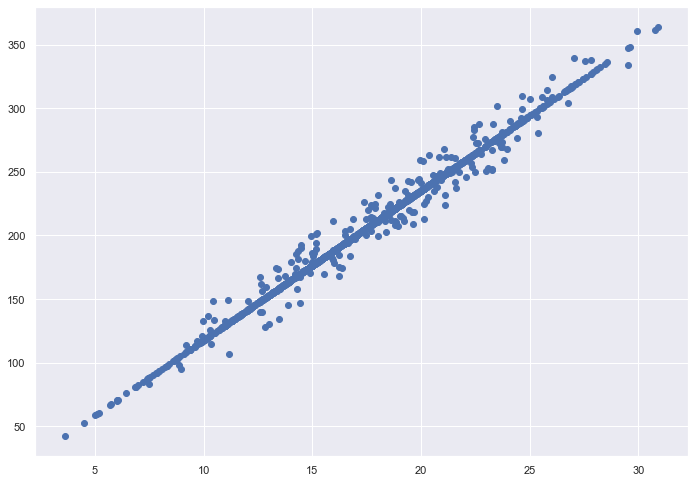

In [316]:
plt.scatter(df_test['total_eve_charge'],df_test['total_eve_min'])
plt.show()

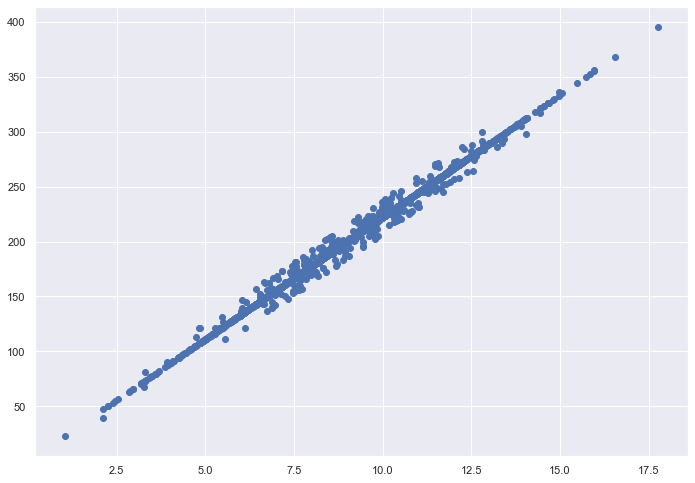

In [317]:
plt.scatter(df_train['total_night_charge'],df_train['total_night_minutes'])
plt.show()

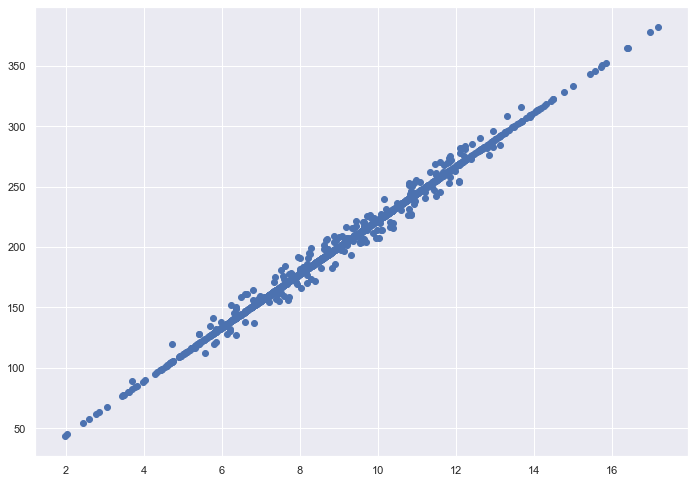

In [318]:
plt.scatter(df_test['total_night_charge'],df_test['total_night_minutes'])
plt.show()

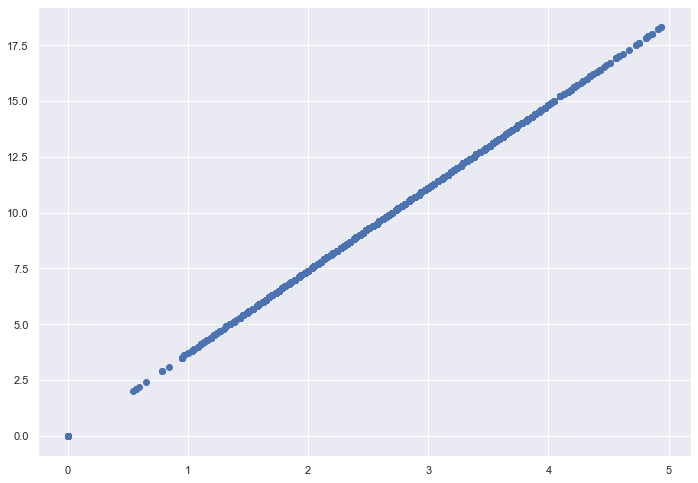

In [319]:
plt.scatter(df_train['total_intl_charge'],df_train['total_intl_minutes'])
plt.show()

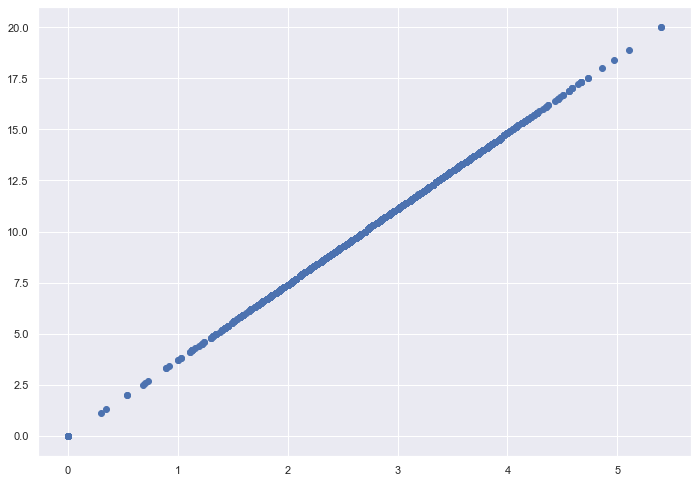

In [320]:
plt.scatter(df_test['total_intl_charge'],df_test['total_intl_minutes'])
plt.show()

In [321]:
from sklearn.decomposition import PCA
pca = PCA(n_components=1)

In [322]:
pca.fit(df_train[['total_intl_charge' , 'total_intl_minutes']])
X_pca1 = pca.transform(df_train[['total_intl_charge' , 'total_intl_minutes']])
df_1p = pd.DataFrame(data = X_pca1 , columns=['PCA1'] , index=df_train.index)

In [323]:
pca.fit(df_train[['total_night_charge' , 'total_night_minutes']])
X_pca2 = pca.transform(df_train[['total_night_charge' , 'total_night_minutes']])
df_2p = pd.DataFrame(data = X_pca2 , columns=['PCA1'] , index=df_train.index)

In [324]:
pca.fit(df_train[['total_eve_charge' , 'total_eve_min']])
X_pca3 = pca.transform(df_train[['total_eve_charge' , 'total_eve_min']])
df_3p = pd.DataFrame(data = X_pca3 , columns=['PCA1'] , index=df_train.index)

In [325]:
pca.fit(df_train[['total_day_charge' , 'total_day_min']])
X_pca4 = pca.transform(df_train[['total_day_charge' , 'total_day_min']])
df_4p = pd.DataFrame(data = X_pca4 , columns=['PCA1'] , index=df_train.index)

In [326]:
pca.fit(df_train[['number_vm_messages' , 'voice_mail_plan']])
X_pca5 = pca.transform(df_train[['number_vm_messages' , 'voice_mail_plan']])
df_5p = pd.DataFrame(data = X_pca5 , columns=['PCA1'] , index=df_train.index)

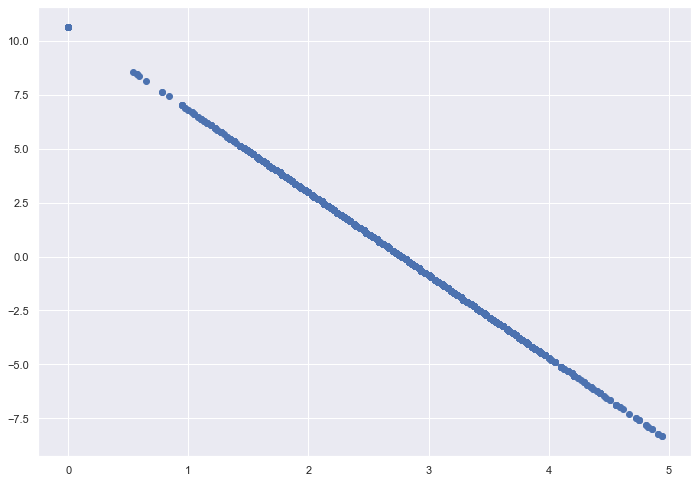

In [327]:
plt.scatter(df_train['total_intl_charge'],df_1p['PCA1'])
plt.show()

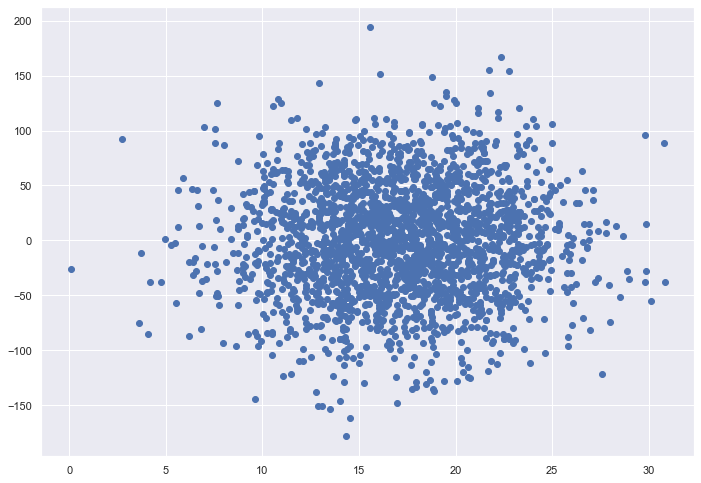

In [328]:
plt.scatter(df_train['total_eve_charge'],df_2p['PCA1'])
plt.show()

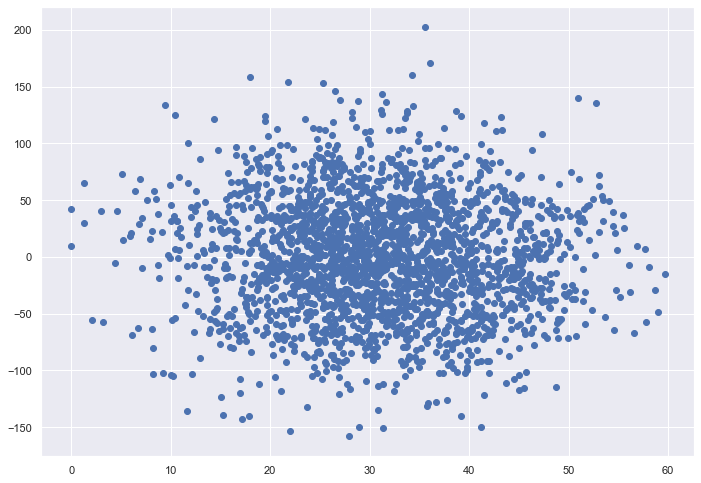

In [329]:
plt.scatter(df_train['total_day_charge'],df_3p['PCA1'])
plt.show()

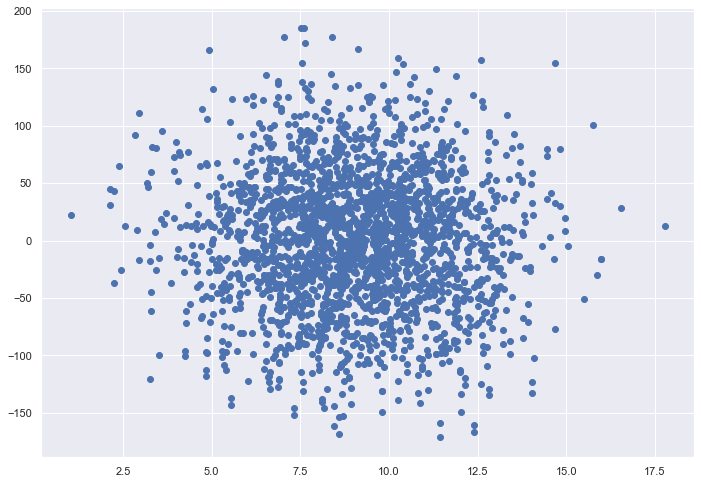

In [330]:
plt.scatter(df_train['total_night_charge'],df_4p['PCA1'])
plt.show()

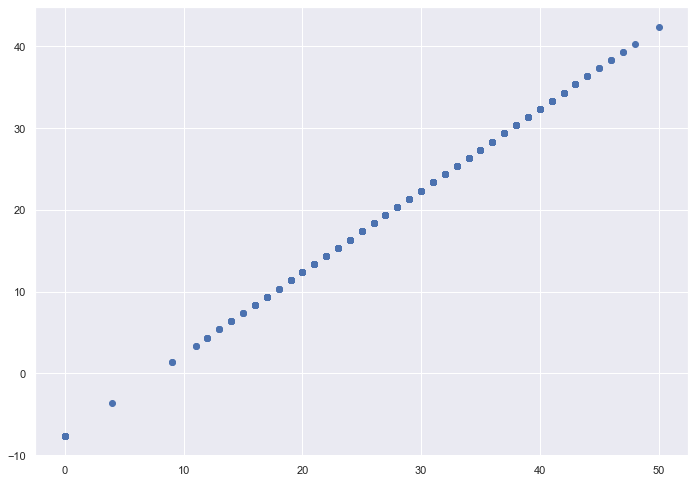

In [331]:
plt.scatter(df_train['number_vm_messages'],df_5p['PCA1'])
plt.show()

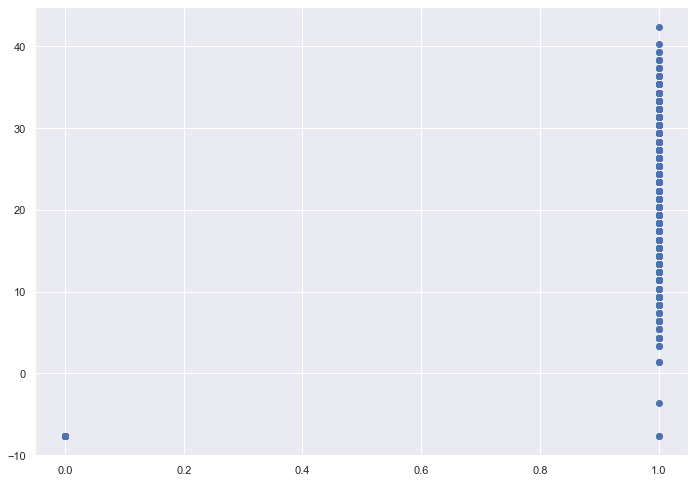

In [332]:
plt.scatter(df_train['voice_mail_plan'],df_5p['PCA1'])
plt.show()

In [333]:
pca.fit(df_test[['total_intl_charge' , 'total_intl_minutes']])
X_pca11 = pca.transform(df_test[['total_intl_charge' , 'total_intl_minutes']])
df_11p = pd.DataFrame(data = X_pca11, columns=['PCA1'] , index=df_test.index)

In [334]:
pca.fit(df_test[['total_night_charge' , 'total_night_minutes']])
X_pca22 = pca.transform(df_test[['total_night_charge' , 'total_night_minutes']])
df_22p = pd.DataFrame(data = X_pca22 , columns=['PCA1'] , index=df_test.index)

In [335]:
pca.fit(df_test[['total_eve_charge' , 'total_eve_min']])
X_pca33 = pca.transform(df_test[['total_eve_charge' , 'total_eve_min']])
df_33p = pd.DataFrame(data = X_pca33 , columns=['PCA1'] , index=df_test.index)

In [336]:
pca.fit(df_test[['total_day_charge' , 'total_day_min']])
X_pca44 = pca.transform(df_test[['total_day_charge' , 'total_day_min']])
df_44p = pd.DataFrame(data = X_pca44 , columns=['PCA1'] , index=df_test.index)

In [337]:
pca.fit(df_test[['number_vm_messages' , 'voice_mail_plan']])
X_pca55 = pca.transform(df_test[['number_vm_messages' , 'voice_mail_plan']])
df_55p = pd.DataFrame(data = X_pca55 , columns=['PCA1'] , index=df_test.index)

In [338]:
df_train['PC1'] = df_1p['PCA1']
df_train['PC2'] = df_2p['PCA1']
df_train['PC3'] = df_3p['PCA1']
df_train['PC4'] = df_4p['PCA1']
df_train['PC5'] = df_5p['PCA1']

In [339]:
df_test['PC1'] = df_11p['PCA1']
df_test['PC2'] = df_22p['PCA1']
df_test['PC3'] = df_33p['PCA1']
df_test['PC4'] = df_44p['PCA1']
df_test['PC5'] = df_55p['PCA1']

In [340]:
df_train = df_train.drop(columns=['total_intl_charge' , 'total_intl_minutes' , 'total_night_charge' , 'total_night_minutes' ,'total_eve_charge' , 'total_eve_min' , 'total_day_charge' , 'total_day_min' , 'number_vm_messages' , 'voice_mail_plan'])

In [341]:
df_test = df_test.drop(columns=['total_intl_charge' , 'total_intl_minutes' , 'total_night_charge' , 'total_night_minutes' ,'total_eve_charge' , 'total_eve_min' , 'total_day_charge' , 'total_day_min' , 'number_vm_messages' , 'voice_mail_plan'])

In [342]:
df_train

,customer_id,account_length,intertiol_plan,total_day_calls,total_eve_calls,total_night_calls,total_intl_calls,customer_service_calls,Churn,location_code_452,location_code_445,location_code_547,PC1,PC2,PC3,PC4,PC5
0,1001,15.0,0,130.0,86.0,33.0,5.0,2.0,0,0.0,1.0,0.0,-6.038312,34.103374,-14.534628,62.144553,-7.646604
1,1002,105.0,0,96.0,97.0,36.0,5.0,3.0,0,0.0,1.0,0.0,-1.790713,21.390589,26.412662,-78.037448,-7.646604
2,1003,97.0,0,94.0,120.0,38.0,4.0,5.0,0,0.0,1.0,0.0,3.698813,2.471485,-67.825807,-1.049058,24.369015
3,1004,121.0,0,95.0,69.0,42.0,4.0,1.0,0,1.0,0.0,0.0,-1.169749,-3.634935,-7.709939,115.296635,27.367583
4,1005,98.0,0,89.0,143.0,42.0,5.0,0.0,0,0.0,1.0,0.0,0.591386,-93.525767,108.507372,-97.310029,14.373792
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2316,3317,109.0,0,100.0,103.0,105.0,8.0,3.0,0,0.0,1.0,0.0,2.558641,-61.693630,-27.581926,2.400052,-7.646604
2317,3318,185.0,1,114.0,106.0,105.0,3.0,2.0,0,0.0,1.0,0.0,-2.722160,57.427020,83.116185,28.671124,22.369971
2318,3319,55.0,1,88.0,105.0,105.0,5.0,1.0,1,0.0,1.0,0.0,-4.172813,8.665684,-68.813822,-7.044842,-7.646604
2319,3320,138.0,1,130.0,88.0,105.0,1.0,0.0,1,0.0,0.0,1.0,-5.104259,40.391637,37.149602,-8.934999,-7.646604


In [343]:
df_test

,customer_id,account_length,intertiol_plan,total_day_calls,total_eve_calls,total_night_calls,total_intl_calls,customer_service_calls,location_code_452,location_code_445,location_code_547,PC1,PC2,PC3,PC4,PC5
0,3322,91.0,1,112.0,93.0,105.0,3.0,2.0,1.0,0.0,0.0,-1.834913,-43.696234,14.184155,-74.709270,-7.805350
1,3323,113.0,0,81.0,62.0,105.0,3.0,5.0,1.0,0.0,0.0,1.687358,73.316220,35.670189,28.797414,12.216332
2,3324,122.0,0,137.0,134.0,105.0,4.0,1.0,1.0,0.0,0.0,1.582995,49.077352,-60.051646,-53.374608,-7.805350
3,3325,103.0,0,117.0,130.0,105.0,7.0,8.0,1.0,0.0,0.0,-0.073778,4.983094,48.056515,51.559294,-7.805350
4,3326,111.0,0,120.0,66.0,105.0,1.0,4.0,0.0,1.0,0.0,-2.455877,-61.438043,-7.204483,69.148922,-7.805350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,4817,23.0,0,107.0,115.0,158.0,3.0,2.0,0.0,0.0,1.0,-1.005223,-61.211816,-47.779640,-138.989171,-7.805350
1496,4818,23.0,0,107.0,121.0,158.0,2.0,2.0,0.0,0.0,1.0,-1.005223,-75.197763,-57.744188,-151.471962,-7.805350
1497,4819,103.0,0,134.0,112.0,164.0,6.0,2.0,0.0,1.0,0.0,-1.730550,-33.483627,69.743150,115.307784,-7.805350
1498,4820,34.0,0,74.0,84.0,166.0,4.0,0.0,0.0,1.0,0.0,1.582995,18.969042,77.370050,-9.254694,-7.805350


In [344]:
df_train = df_train.drop(columns=['customer_id'])
df_test = df_test.drop(columns=['customer_id'])

In [345]:
df_train.columns

Index(['account_length', 'intertiol_plan', 'total_day_calls',
       'total_eve_calls', 'total_night_calls', 'total_intl_calls',
       'customer_service_calls', 'Churn', 'location_code_452',
       'location_code_445', 'location_code_547', 'PC1', 'PC2', 'PC3', 'PC4',
       'PC5'],
      dtype='object')

In [346]:
col = ['account_length', 'total_day_calls',
       'total_eve_calls', 'total_night_calls', 'total_intl_calls',
       'customer_service_calls', 'PC1', 'PC2', 'PC3', 'PC4',
       'PC5']

In [347]:
# scaler = StandardScaler()
# scaler.fit(df_train[col])

In [348]:
# df_train[col] = pd.DataFrame(scaler.transform(df_train[col]) ,index = df_train.index , columns = col)

In [349]:
# scaler.fit(df_test[col])

In [350]:
# df_test[col] = pd.DataFrame(scaler.transform(df_test[col]) , index = df_test.index , columns = col)

In [369]:
df_train

,account_length,intertiol_plan,total_day_calls,total_eve_calls,total_night_calls,total_intl_calls,customer_service_calls,Churn,location_code_452,location_code_445,location_code_547,PC1,PC2,PC3,PC4,PC5
0,15.0,0,130.0,86.0,33.0,5.0,2.0,0,0.0,1.0,0.0,-6.038312,34.103374,-14.534628,62.144553,-7.646604
1,105.0,0,96.0,97.0,36.0,5.0,3.0,0,0.0,1.0,0.0,-1.790713,21.390589,26.412662,-78.037448,-7.646604
2,97.0,0,94.0,120.0,38.0,4.0,5.0,0,0.0,1.0,0.0,3.698813,2.471485,-67.825807,-1.049058,24.369015
3,121.0,0,95.0,69.0,42.0,4.0,1.0,0,1.0,0.0,0.0,-1.169749,-3.634935,-7.709939,115.296635,27.367583
4,98.0,0,89.0,143.0,42.0,5.0,0.0,0,0.0,1.0,0.0,0.591386,-93.525767,108.507372,-97.310029,14.373792
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2316,109.0,0,100.0,103.0,105.0,8.0,3.0,0,0.0,1.0,0.0,2.558641,-61.693630,-27.581926,2.400052,-7.646604
2317,185.0,1,114.0,106.0,105.0,3.0,2.0,0,0.0,1.0,0.0,-2.722160,57.427020,83.116185,28.671124,22.369971
2318,55.0,1,88.0,105.0,105.0,5.0,1.0,1,0.0,1.0,0.0,-4.172813,8.665684,-68.813822,-7.044842,-7.646604
2319,138.0,1,130.0,88.0,105.0,1.0,0.0,1,0.0,0.0,1.0,-5.104259,40.391637,37.149602,-8.934999,-7.646604


In [370]:
df_test

,account_length,intertiol_plan,total_day_calls,total_eve_calls,total_night_calls,total_intl_calls,customer_service_calls,location_code_452,location_code_445,location_code_547,PC1,PC2,PC3,PC4,PC5
0,91.0,1,112.0,93.0,105.0,3.0,2.0,1.0,0.0,0.0,-1.834913,-43.696234,14.184155,-74.709270,-7.805350
1,113.0,0,81.0,62.0,105.0,3.0,5.0,1.0,0.0,0.0,1.687358,73.316220,35.670189,28.797414,12.216332
2,122.0,0,137.0,134.0,105.0,4.0,1.0,1.0,0.0,0.0,1.582995,49.077352,-60.051646,-53.374608,-7.805350
3,103.0,0,117.0,130.0,105.0,7.0,8.0,1.0,0.0,0.0,-0.073778,4.983094,48.056515,51.559294,-7.805350
4,111.0,0,120.0,66.0,105.0,1.0,4.0,0.0,1.0,0.0,-2.455877,-61.438043,-7.204483,69.148922,-7.805350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,23.0,0,107.0,115.0,158.0,3.0,2.0,0.0,0.0,1.0,-1.005223,-61.211816,-47.779640,-138.989171,-7.805350
1496,23.0,0,107.0,121.0,158.0,2.0,2.0,0.0,0.0,1.0,-1.005223,-75.197763,-57.744188,-151.471962,-7.805350
1497,103.0,0,134.0,112.0,164.0,6.0,2.0,0.0,1.0,0.0,-1.730550,-33.483627,69.743150,115.307784,-7.805350
1498,34.0,0,74.0,84.0,166.0,4.0,0.0,0.0,1.0,0.0,1.582995,18.969042,77.370050,-9.254694,-7.805350


In [353]:
# Models

In [354]:
y = df_train['Churn']
X = df_train.drop(columns = ['Churn'])

In [355]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [356]:
## logistic regression model

In [357]:
from sklearn.linear_model import LogisticRegression
model1 = LogisticRegression()
result = model1.fit(X_train, y_train)
from sklearn import metrics
prediction_test = model1.predict(X_test)
# Print the prediction accuracy
print (metrics.accuracy_score(y_test, prediction_test))

0.7680115273775217


In [358]:
## Random Forest model

In [359]:
from sklearn.ensemble import RandomForestClassifier

model_rf = RandomForestClassifier(n_estimators=1000 , oob_score = True, n_jobs = -1,
                                  random_state =50, max_features = "auto",
                                  max_leaf_nodes = 30)
model_rf.fit(X_train, y_train)

# Make predictions
prediction_test = model_rf.predict(X_test)
print (metrics.accuracy_score(y_test, prediction_test))

0.9236311239193083


In [360]:
## Support Vecor Machine (SVM)

In [361]:
from sklearn.svm import SVC

model.svm = SVC(kernel='linear') 
model.svm.fit(X_train,y_train)
preds = model.svm.predict(X_test)
metrics.accuracy_score(y_test, preds)

0.770893371757925

In [362]:
## ADA Boost

In [363]:
# AdaBoost Algorithm
from sklearn.ensemble import AdaBoostClassifier
model2 = AdaBoostClassifier()
# n_estimators = 50 (default value) 
# base_estimator = DecisionTreeClassifier (default value)
model2.fit(X_train,y_train)
preds = model2.predict(X_test)
metrics.accuracy_score(y_test, preds)

0.845821325648415

In [364]:
## XG Boost

In [365]:
from xgboost import XGBClassifier
model3 = XGBClassifier()
model3.fit(X_train, y_train)
preds = model3.predict(X_test)
metrics.accuracy_score(y_test, preds)

[21:17:10] WARNING: D:\bld\xgboost-split_1645118015404\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.9409221902017291

In [366]:
## CatBoost

In [367]:
from catboost import CatBoostClassifier


model4 = CatBoostClassifier(
    iterations=100, 
    learning_rate=0.05, 
    #loss_function='CrossEntropy'
)


model4.fit(X_train, y_train)

preds = model4.predict(X_test)
metrics.accuracy_score(y_test, preds)

0:	learn: 0.6660317	total: 198ms	remaining: 19.6s
1:	learn: 0.6444448	total: 200ms	remaining: 9.81s
2:	learn: 0.6231927	total: 202ms	remaining: 6.54s
3:	learn: 0.6029287	total: 204ms	remaining: 4.9s
4:	learn: 0.5847122	total: 206ms	remaining: 3.92s
5:	learn: 0.5687596	total: 208ms	remaining: 3.26s
6:	learn: 0.5531328	total: 210ms	remaining: 2.79s
7:	learn: 0.5377580	total: 212ms	remaining: 2.44s
8:	learn: 0.5248063	total: 214ms	remaining: 2.16s
9:	learn: 0.5121775	total: 216ms	remaining: 1.94s
10:	learn: 0.5007879	total: 218ms	remaining: 1.76s
11:	learn: 0.4895429	total: 220ms	remaining: 1.61s
12:	learn: 0.4785300	total: 222ms	remaining: 1.49s
13:	learn: 0.4690411	total: 224ms	remaining: 1.38s
14:	learn: 0.4590627	total: 227ms	remaining: 1.28s
15:	learn: 0.4497958	total: 228ms	remaining: 1.2s
16:	learn: 0.4406067	total: 230ms	remaining: 1.12s
17:	learn: 0.4306782	total: 232ms	remaining: 1.06s
18:	learn: 0.4225463	total: 234ms	remaining: 999ms
19:	learn: 0.4156984	total: 236ms	remaining

0.9293948126801153

In [368]:
# XG Boost perform well

In [372]:
df_train.to_excel("train_final.xlsx")
df_test.to_excel("test_final.xlsx")